In [1]:
%reload_ext autoreload
%autoreload 2

In [2]:
import nwb_datajoint as nd
    
# ignore datajoint+jupyter async warnings
import warnings
warnings.simplefilter('ignore', category=DeprecationWarning)
warnings.simplefilter('ignore', category=ResourceWarning)

Connecting edeno@lmf-db.cin.ucsf.edu:3306


In [3]:
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
import logging

FORMAT = '%(asctime)s %(message)s'

logging.basicConfig(level='INFO', format=FORMAT, datefmt='%d-%b-%y %H:%M:%S')

In [4]:
nwb_copy_file_name = 'chimi20200216_new_.nwb'

## Marks

The first thing we need are the marks for the clusterless decoding. This depends on the SpikeSorting and CuratedSpikeSorting tables, but we can circumvent using a spike sorter by using the `clusterless_thresholder` as our given spikesorter, which simply thresholds the spikeband waveforms and returns a single multiunit cluster. Here we use mark parameters `default` and unit_inclusion_parameters `all2`, which we need to use because our clusterless units don't have any metrics calculated on them.



In [5]:
import pandas as pd
from nwb_datajoint.decoding.clusterless import UnitMarks


pd.DataFrame(
    (UnitMarks() & {'nwb_file_name': nwb_copy_file_name,
                    'unit_inclusion_param_name': 'all2'}))

,nwb_file_name,sort_group_id,sort_interval_name,filter_parameter_set_name,sorting_id,unit_inclusion_param_name,mark_param_name,analysis_file_name,marks_object_id
0,chimi20200216_new_.nwb,0,runs_noPrePostTrialTimes raw data valid times,franklab_default_hippocampus,S-6dffb97e681d,all2,default,chimi20200216_new_DFHOC12ZJF.nwb,41988ab9-e791-4ea0-afae-246676d15ad7
1,chimi20200216_new_.nwb,1,runs_noPrePostTrialTimes raw data valid times,franklab_default_hippocampus,S-628e2c78f8a5,all2,default,chimi20200216_new_IBWA5MF032.nwb,a06dff53-acad-4f92-88c4-c3fa6a57f0fa
2,chimi20200216_new_.nwb,2,runs_noPrePostTrialTimes raw data valid times,franklab_default_hippocampus,S-1db1e036a563,all2,default,chimi20200216_new_2NGPX2CDHS.nwb,2bf06a91-373d-4bee-93b6-dc1e04fcc798
3,chimi20200216_new_.nwb,3,runs_noPrePostTrialTimes raw data valid times,franklab_default_hippocampus,S-3a8004f4eeaa,all2,default,chimi20200216_new_U8X2DHFUE4.nwb,1b5a604c-f7a3-4500-9295-9564d02f965d
4,chimi20200216_new_.nwb,5,runs_noPrePostTrialTimes raw data valid times,franklab_default_hippocampus,S-83e639e6c6a4,all2,default,chimi20200216_new_56ZPP0EQUN.nwb,454f63b4-782d-486d-be9c-395416556815
5,chimi20200216_new_.nwb,6,runs_noPrePostTrialTimes raw data valid times,franklab_default_hippocampus,S-1d23a929c5d4,all2,default,chimi20200216_new_XDMSYIKUU1.nwb,60358ab6-13fe-4e27-bd91-032b950b3468
6,chimi20200216_new_.nwb,7,runs_noPrePostTrialTimes raw data valid times,franklab_default_hippocampus,S-52a76f1f47e1,all2,default,chimi20200216_new_JYG932ZTCS.nwb,248de316-1c14-4ea4-b009-1ae3492033d2
7,chimi20200216_new_.nwb,8,runs_noPrePostTrialTimes raw data valid times,franklab_default_hippocampus,S-02fcf3ca1a92,all2,default,chimi20200216_new_50L7HXU3OT.nwb,79ec718a-2f75-4eba-8270-9abbf9cf6c08
8,chimi20200216_new_.nwb,9,runs_noPrePostTrialTimes raw data valid times,franklab_default_hippocampus,S-e59c4ff592c5,all2,default,chimi20200216_new_NZ2XM564PJ.nwb,04f9c8fb-8064-4a8d-a6cc-84f5efb498de
9,chimi20200216_new_.nwb,10,runs_noPrePostTrialTimes raw data valid times,franklab_default_hippocampus,S-2ddfe990560f,all2,default,chimi20200216_new_SGNTHVDJQ6.nwb,b1832474-cc00-4669-8364-535150ee1aa9


After populating the UnitMarks table, we now need to turn those marks into a marks indicator via the UnitMarksIndicator table. This bins time at a specified sampling frequency (default 2 ms bins or 500 Hz), returning a NaN if there is no spike in that time bin and returning marks if there is a spike in that time bin. If more than one spike is in a single time bin from a single tetrode, we just average the marks. Technically this isn't ideal, we should use all the marks, but it doesn't seem to happen that often and the decodes seem robust to it.

The UnitMarksIndicator table depends on an interval from the interval list and a sampling rate.

In [6]:
from nwb_datajoint.decoding.clusterless import UnitMarksIndicatorSelection, UnitMarksIndicator, UnitMarks


selection = ((UnitMarks() &
  {'nwb_file_name': nwb_copy_file_name,
   'unit_inclusion_param_name': 'all2'})
 * 
  (nd.common.IntervalList() &
   {'nwb_file_name': nwb_copy_file_name, 'interval_list_name': 'pos 1 valid times'})
  )

UnitMarksIndicatorSelection.insert(selection, ignore_extra_fields=True, skip_duplicates=True)

UnitMarksIndicator.populate()

20-Feb-22 20:00:29 Found 0 keys to populate


After we've populated this table, we can fetch all the mark indicators from a set of electrodes using the `fetch_xarray` method. `xarray` is just a python package that produces labeled multidimensional arrays. The decoding results will also come in this format.

In [7]:
marks = (UnitMarksIndicator & {
    'nwb_file_name': nwb_copy_file_name,
    'sort_interval_name': 'runs_noPrePostTrialTimes raw data valid times',
    'filter_parameter_set_name': 'franklab_default_hippocampus',
    'unit_inclusion_param_name': 'all2',
    'mark_param_name': 'default',
    'interval_list_name': 'pos 1 valid times',
    'sampling_rate': 500,    
}).fetch_xarray()

marks

<xarray.DataArray (time: 655645, marks: 4, electrodes: 22)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       ...,

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]])
Coordinates:
  * time     (time) float64 1.582e+09 1.582e+09 ... 1.582e+09 1.582e+09
  * marks    (marks) <U11 'amplitude_0' 'amplitude_1' ... 'amplitude_3'
Dimensions without coordinates: electrodes

After you get the marks, it is important to visualize them to make sure they look right. We can use the `plot_all_marks` method of UnitMarksIndicator to quickly plot each mark feature against the other for each electrode.

Here it is important to look for things that look overly correlated (strong diagonal on the off-diagonal plots) and for extreme amplitudes.

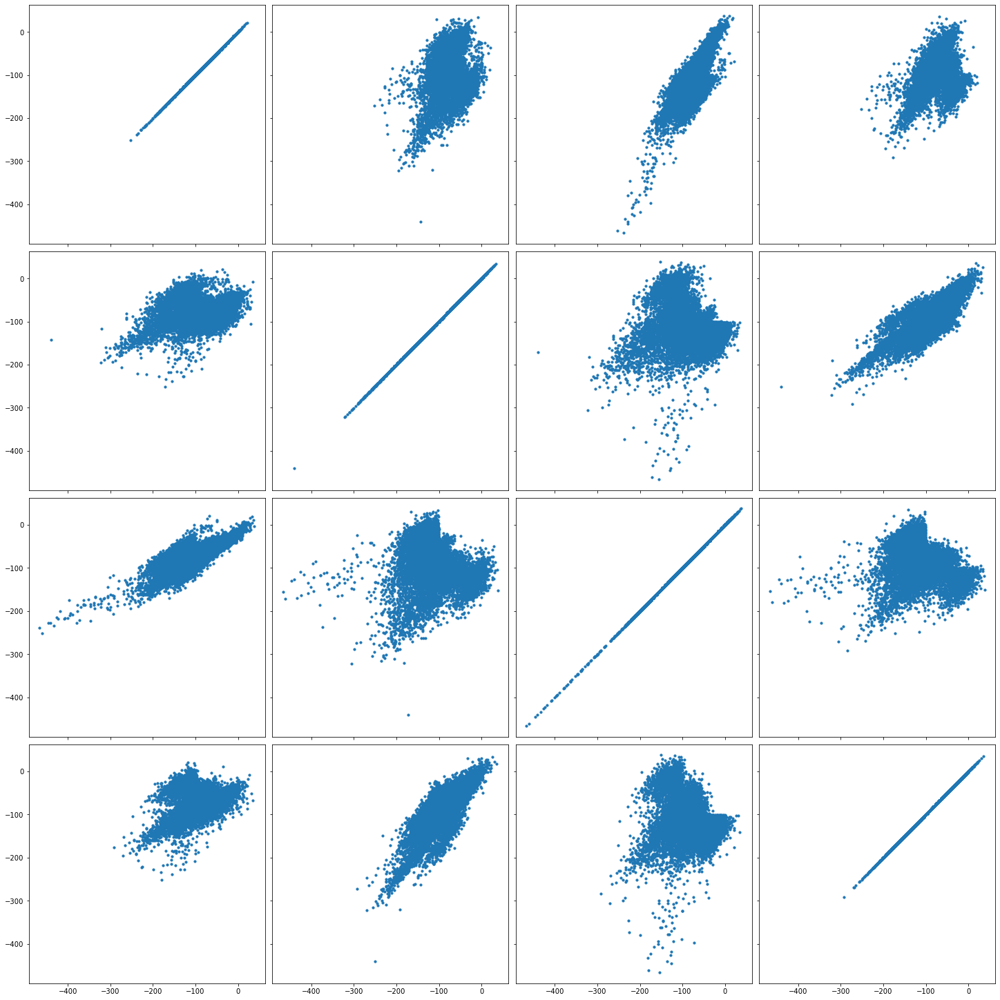

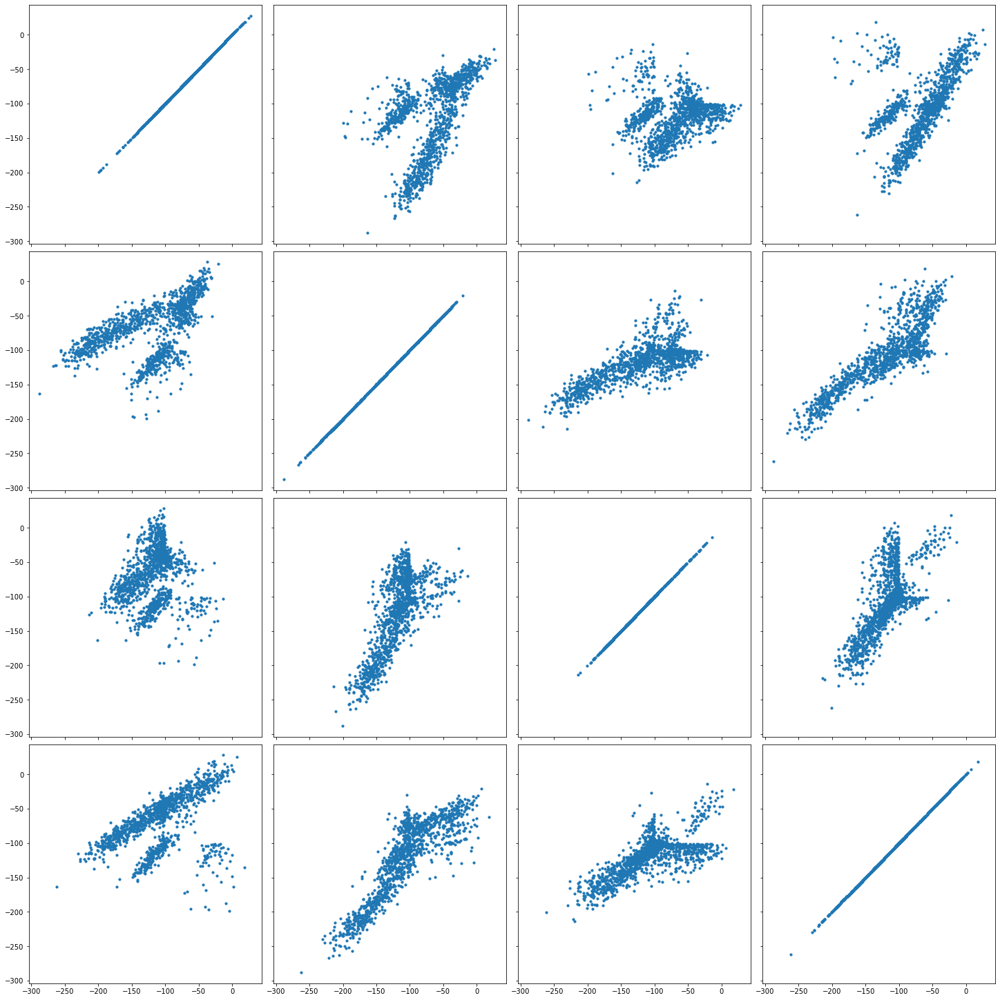

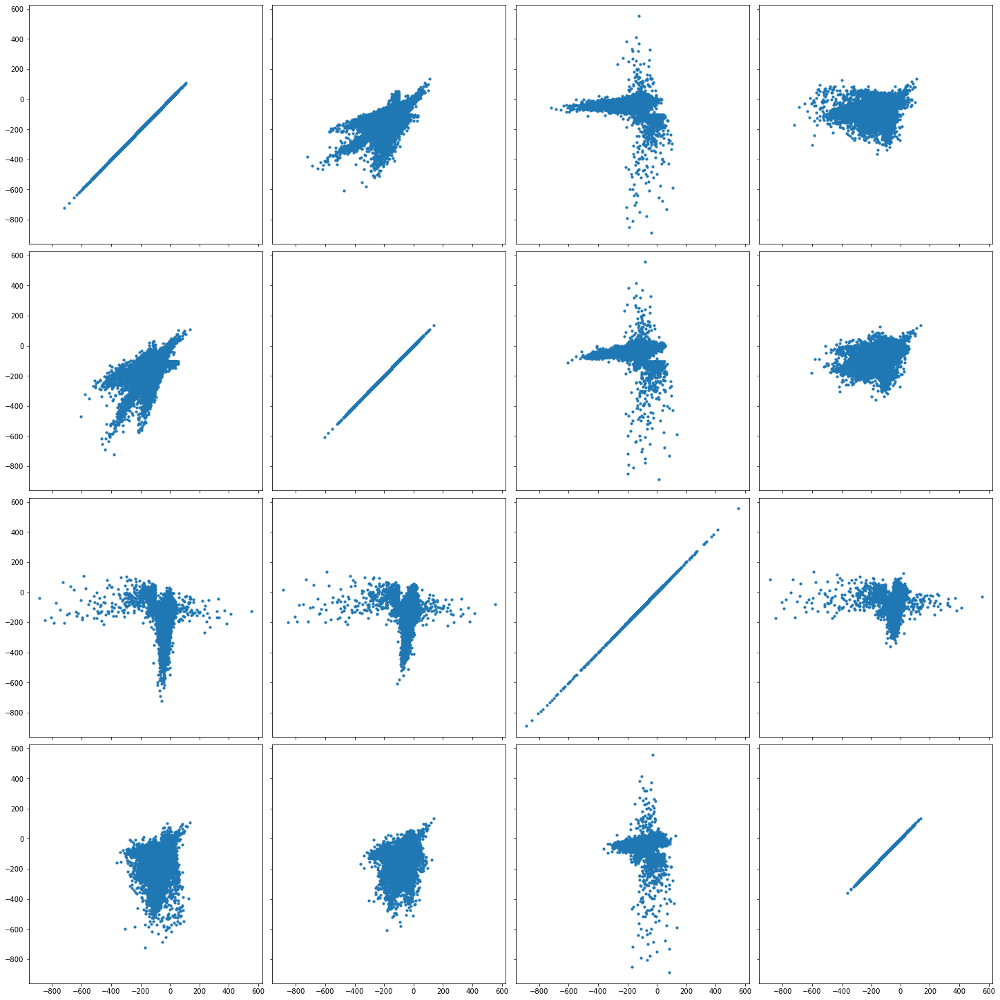

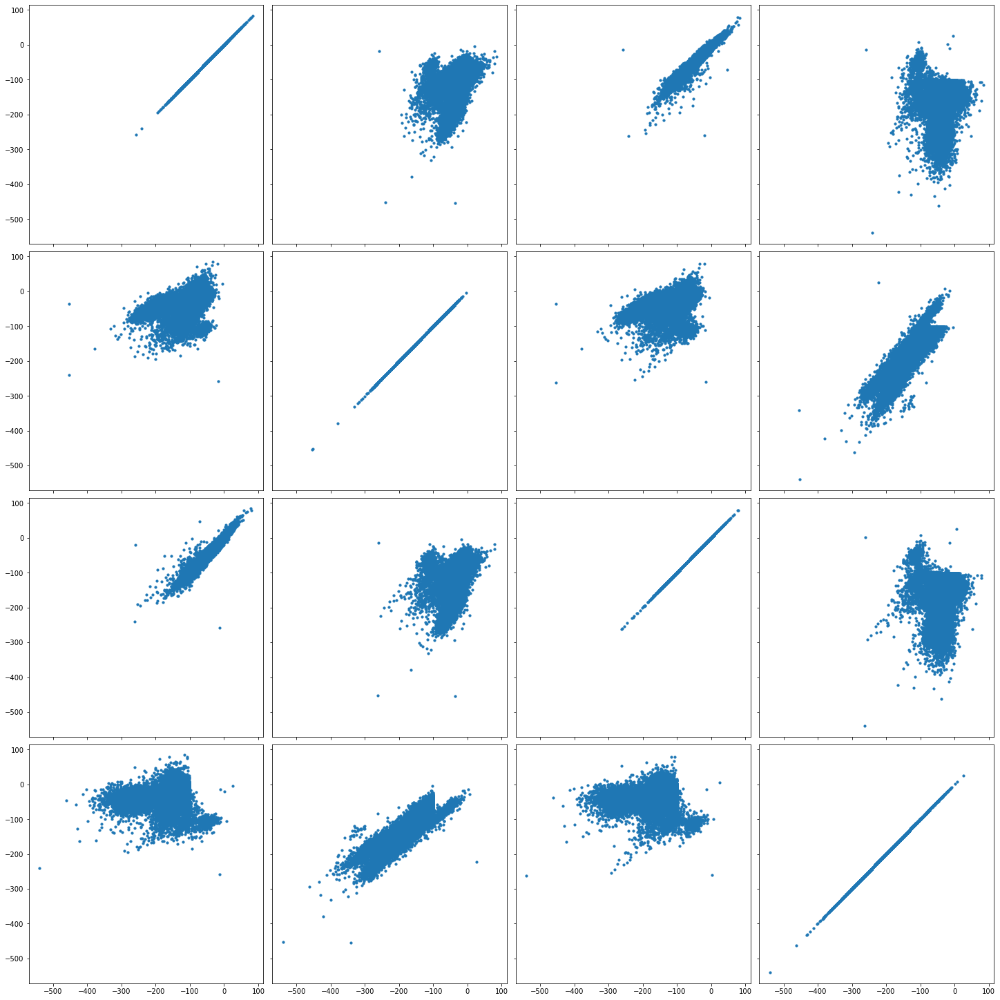

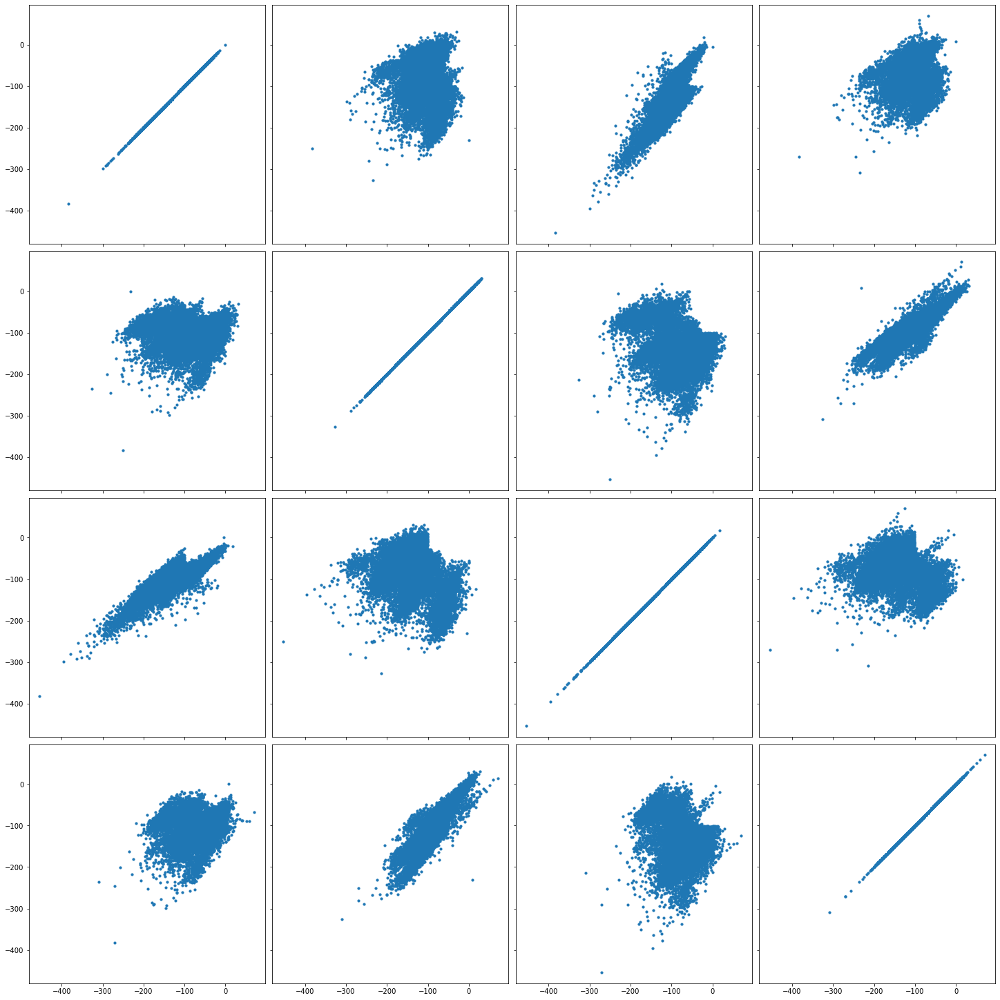

...

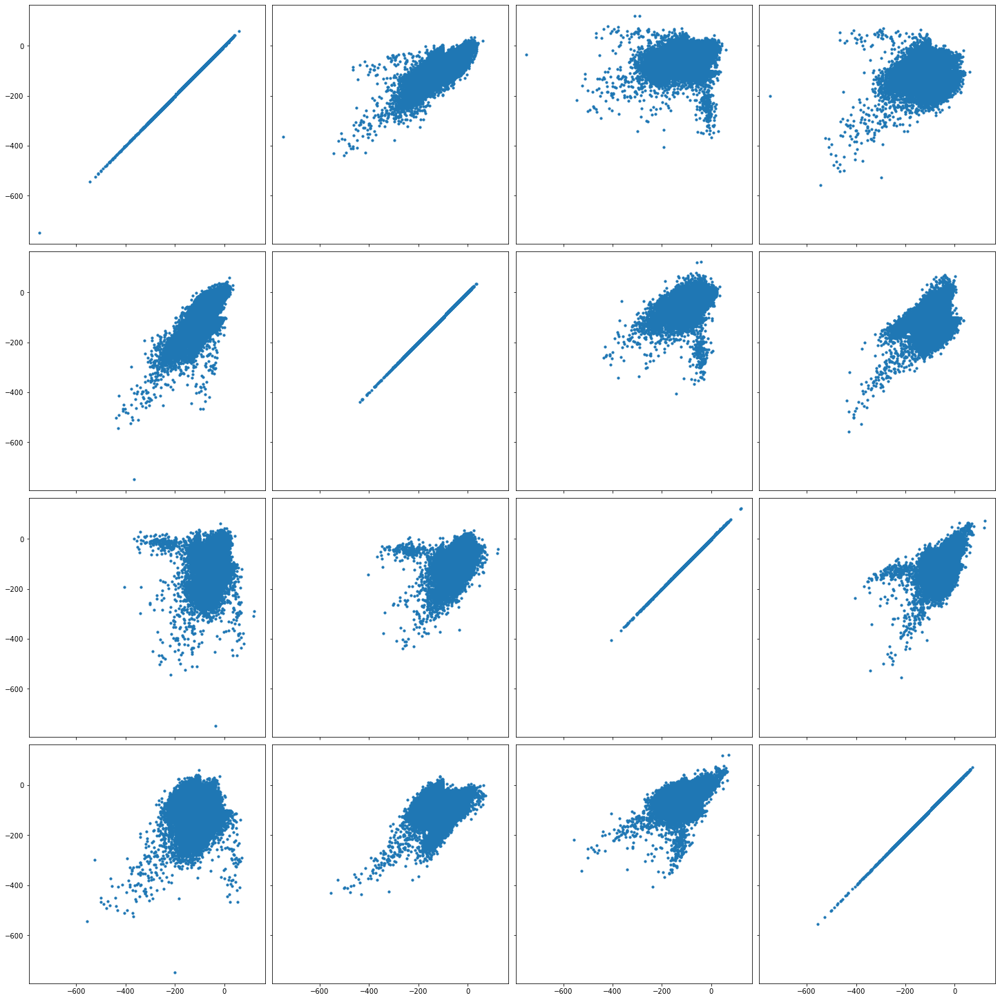

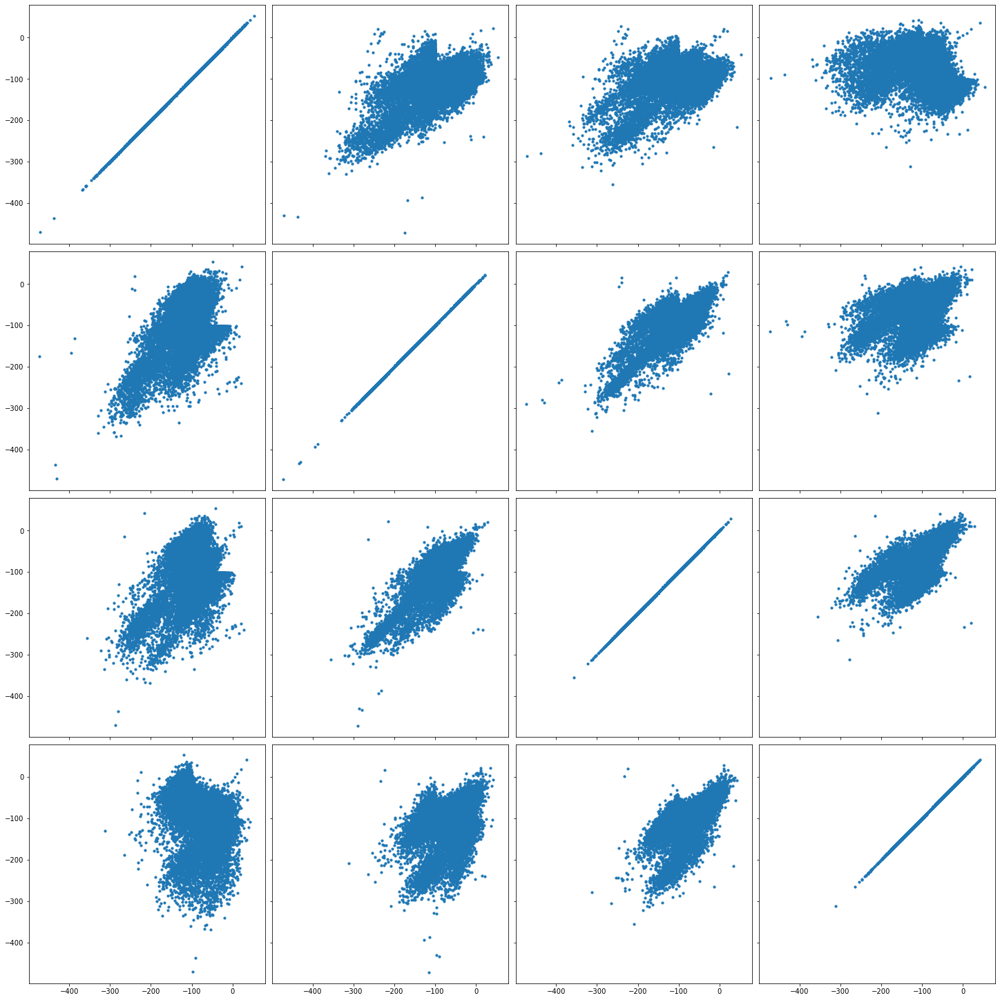

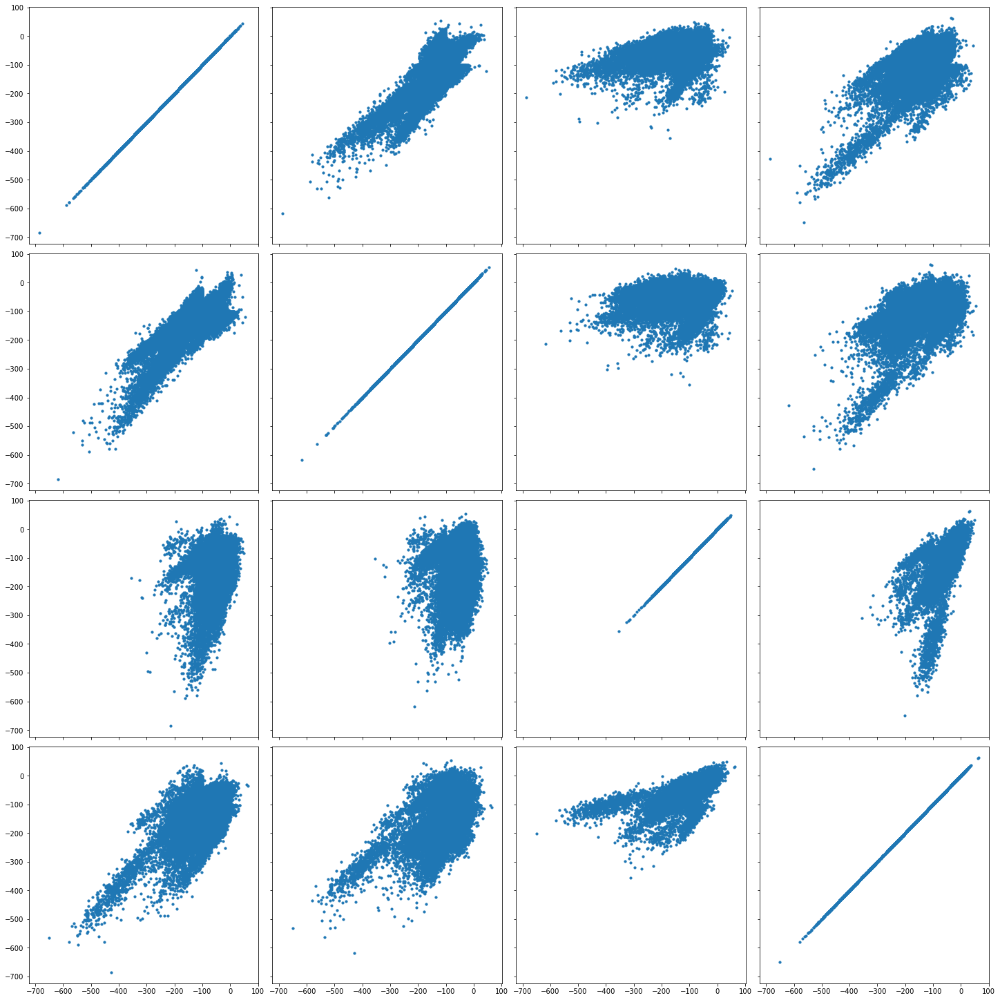

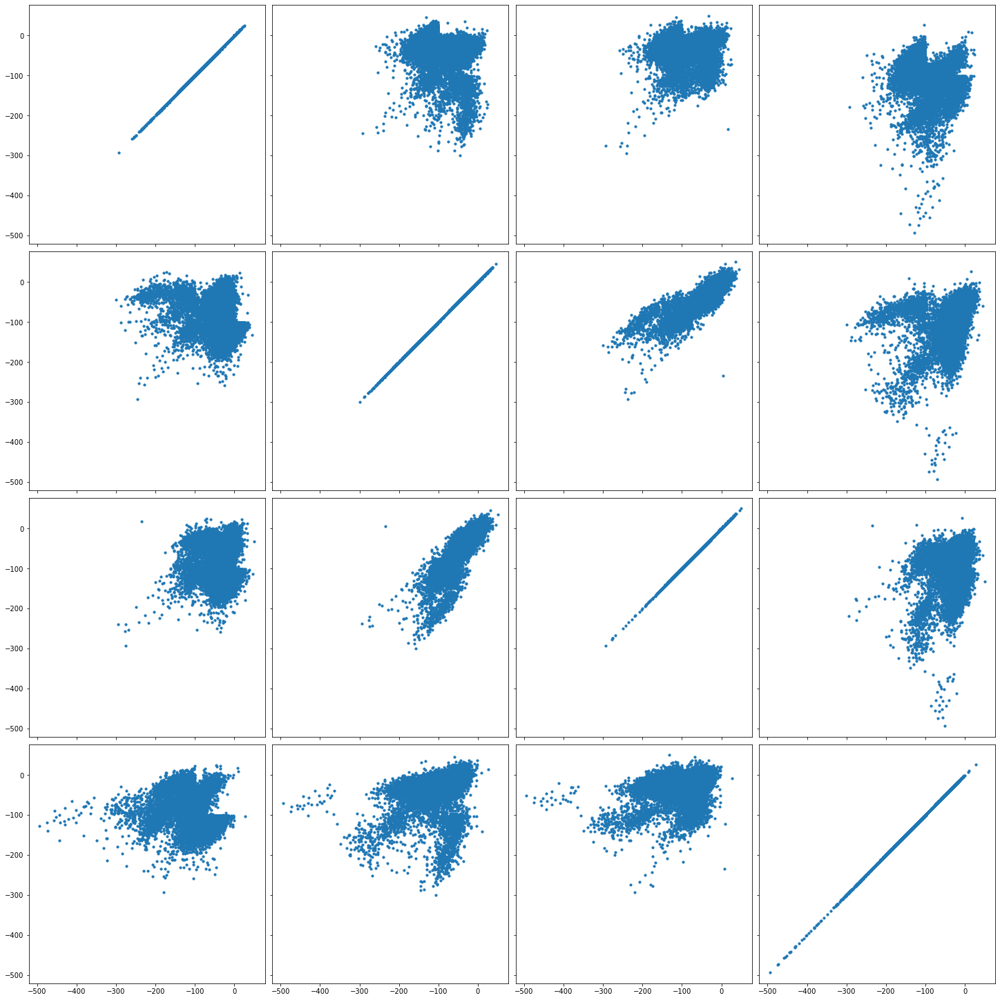

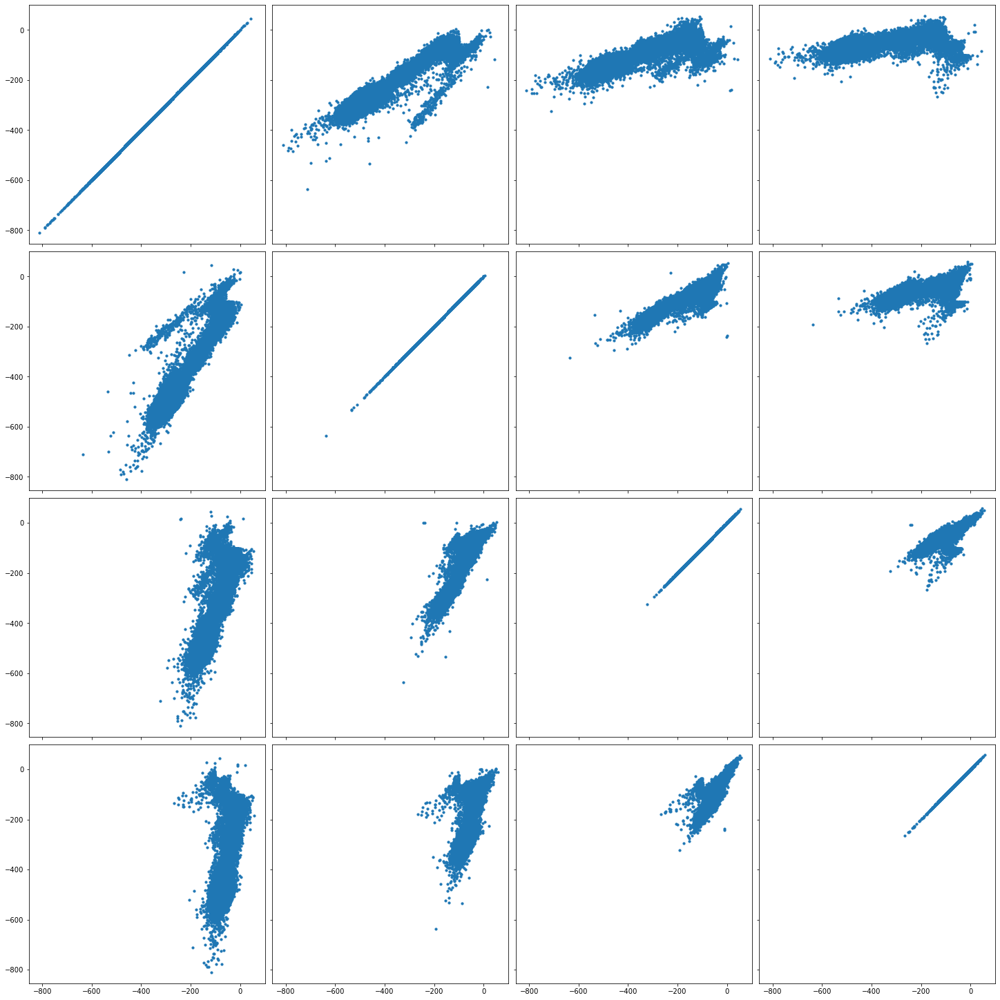

In [8]:
UnitMarksIndicator.plot_all_marks(marks)

## Position

After the marks look good, you'll need to load/populate the 2D position data. This comes from the `IntervalPositionInfo` table. See the position tutorial for more information. Note that we will need to upsample the position data (which is done here via the `default_decoding` parameters) to match the sampling frequency that we intend to decode in (2 ms time bins or 500 Hz sampling rate)

In [9]:
from nwb_datajoint.common.common_position import IntervalPositionInfo, IntervalPositionInfoSelection

IntervalPositionInfoSelection.insert1(
    {'nwb_file_name': nwb_copy_file_name,
     'interval_list_name': 'pos 1 valid times',
     'position_info_param_name': 'default_decoding'
    }, skip_duplicates=True)

IntervalPositionInfo.populate()


position_info = (IntervalPositionInfo() &
                 {'nwb_file_name': nwb_copy_file_name,
                  'interval_list_name': 'pos 1 valid times',
                  'position_info_param_name': 'default_decoding'}
                ).fetch1_dataframe()

position_info

20-Feb-22 20:01:24 Found 0 keys to populate


,head_position_x,head_position_y,head_orientation,head_velocity_x,head_velocity_y,head_speed
time,,,,,,
1.581887e+09,91.051650,211.127050,2.680048,1.741550,2.301478,2.886139
1.581887e+09,91.039455,211.144123,3.003241,1.827555,2.333931,2.964320
1.581887e+09,91.027260,211.161196,3.008398,1.915800,2.366668,3.044898
1.581887e+09,91.015065,211.178268,3.012802,2.006286,2.399705,3.127901
1.581887e+09,91.002871,211.195341,3.017242,2.099012,2.433059,3.213352
...,...,...,...,...,...,...
1.581888e+09,182.158583,201.299625,-0.944304,0.057520,-0.356012,0.360629
1.581888e+09,182.158583,201.296373,-0.942329,0.053954,-0.356343,0.360404
1.581888e+09,182.158583,201.293121,-0.940357,0.050477,-0.356407,0.359964


It is important to visualize the 2D position to make sure there are no weird values.

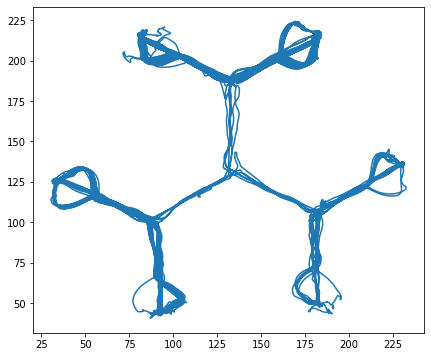

In [10]:
plt.figure(figsize=(7, 6))
plt.plot(position_info.head_position_x, position_info.head_position_y)

Next we populate/load the linearized position tables. Again refer to the linear position tutorials for more information.

In [11]:
from nwb_datajoint.common.common_position import LinearizationParameters

LinearizationParameters.insert1({'linearization_param_name': 'default'}, skip_duplicates=True)
LinearizationParameters()

linearization_param_name name for this set of parameters,use_hmm use HMM to determine linearization,route_euclidean_distance_scaling How much to prefer route distances between successive time points that are closer to the euclidean distance. Smaller numbers mean the route distance is more likely to be close to the euclidean distance.,sensor_std_dev Uncertainty of position sensor (in cm).,diagonal_bias Biases the transition matrix to prefer the current track segment.
default,0,1.0,5.0,0.5


In [12]:
from nwb_datajoint.common.common_position import IntervalLinearizationSelection, IntervalLinearizedPosition


IntervalLinearizationSelection.insert1(
    {'position_info_param_name': 'default',
     'nwb_file_name': nwb_copy_file_name,
     'interval_list_name': 'pos 1 valid times',
     'track_graph_name': '6 arm',
     'linearization_param_name': 'default'
    }, skip_duplicates=True)

IntervalLinearizationSelection.insert1(
    {'position_info_param_name': 'default_decoding',
     'nwb_file_name': nwb_copy_file_name,
     'interval_list_name': 'pos 1 valid times',
     'track_graph_name': '6 arm',
     'linearization_param_name': 'default'
    }, skip_duplicates=True)

IntervalLinearizationSelection() & {'nwb_file_name': nwb_copy_file_name}

position_info_param_name name for this set of parameters,nwb_file_name name of the NWB file,interval_list_name descriptive name of this interval list,track_graph_name,linearization_param_name name for this set of parameters
default,chimi20200216_new_.nwb,pos 1 valid times,6 arm,default
default_decoding,chimi20200216_new_.nwb,pos 1 valid times,6 arm,default


In [13]:
IntervalLinearizedPosition.populate()

20-Feb-22 20:01:26 Found 0 keys to populate


In [14]:
from nwb_datajoint.common.common_position import IntervalLinearizedPosition

linear_position_df = (IntervalLinearizedPosition() &
 {'nwb_file_name': nwb_copy_file_name,
  'interval_list_name': 'pos 1 valid times',
  'position_info_param_name': 'default_decoding'}
).fetch1_dataframe()

linear_position_df

,linear_position,track_segment_id,projected_x_position,projected_y_position
time,,,,
1.581887e+09,412.042773,0,90.802281,210.677533
1.581887e+09,412.061718,0,90.785714,210.686724
1.581887e+09,412.080664,0,90.769147,210.695914
1.581887e+09,412.099610,0,90.752579,210.705105
1.581887e+09,412.118556,0,90.736012,210.714296
...,...,...,...,...
1.581888e+09,340.325042,1,175.434739,212.920160
1.581888e+09,340.323413,1,175.433329,212.919345
1.581888e+09,340.321785,1,175.431919,212.918529


We should also quickly visualize the linear position in order to sanity check the values. Here we plot the 2D position projected to its corresponding 1D segment.

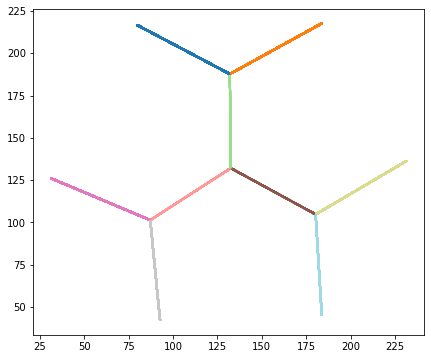

In [15]:
plt.figure(figsize=(7, 6))
plt.scatter(linear_position_df.projected_x_position, linear_position_df.projected_y_position,
            c=linear_position_df.track_segment_id, cmap='tab20', s=1)

We should also plot the linearized position itself to make sure it is okay.

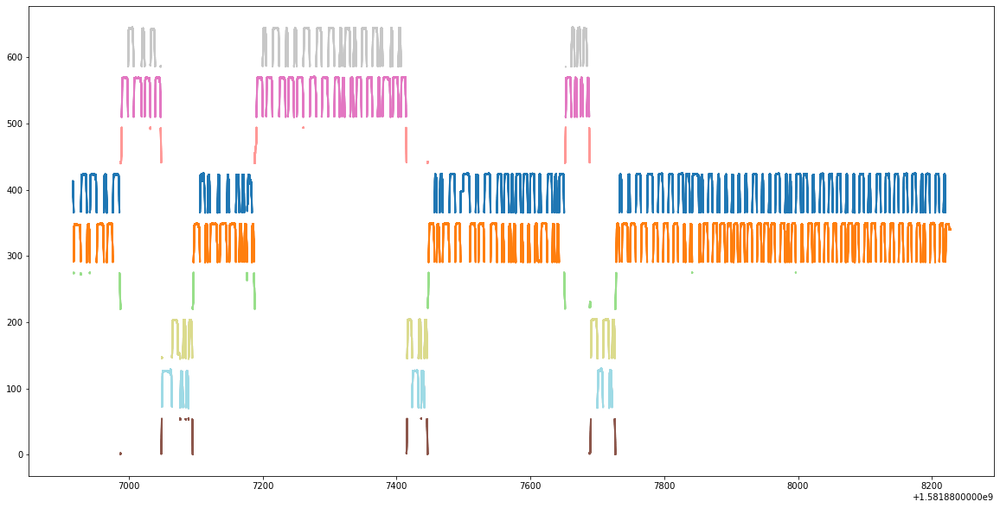

In [16]:
plt.figure(figsize=(20, 10))
plt.scatter(linear_position_df.index, linear_position_df.linear_position, s=1,
            c=linear_position_df.track_segment_id, cmap='tab20')

Okay now that we've looked at the data, we should quickly verify that all our data is the same size.

In [17]:
position_info.shape, marks.shape, linear_position_df.shape

((655645, 6), (655645, 4, 22), (655645, 4))

We also want to make sure we have valid ephys data and valid position data for decoding. Here we only have one valid time interval, but if we had more than one, we should decode on each interval separately.

In [18]:
from nwb_datajoint.common.common_interval import interval_list_intersect
from nwb_datajoint.common import IntervalList

key = {}
key['interval_list_name'] = '02_r1'
key['nwb_file_name'] = nwb_copy_file_name

interval = (IntervalList &
            {'nwb_file_name': key['nwb_file_name'],
             'interval_list_name': key['interval_list_name']}
           ).fetch1('valid_times')

valid_ephys_times = (IntervalList &
                     {'nwb_file_name': key['nwb_file_name'],
                      'interval_list_name': 'raw data valid times'}
                    ).fetch1('valid_times')
position_interval_names = (IntervalPositionInfo &
                           {'nwb_file_name': key['nwb_file_name'],
                            'position_info_param_name': 'default_decoding',
                           }
                          ).fetch('interval_list_name')
valid_pos_times = [(IntervalList &
                   {'nwb_file_name': key['nwb_file_name'],
                    'interval_list_name': pos_interval_name}
                  ).fetch1('valid_times')
                  for pos_interval_name in position_interval_names]

intersect_interval = interval_list_intersect(
    interval_list_intersect(interval, valid_ephys_times), valid_pos_times)
valid_time_slice = slice(intersect_interval[0][0], intersect_interval[0][1])
valid_time_slice

slice(1581886916.3153033, 1581888227.5987928, None)

In [19]:
linear_position_df = linear_position_df.loc[valid_time_slice]
marks = marks.sel(time=valid_time_slice)
position_info = position_info.loc[valid_time_slice]

In [20]:
position_info.shape, marks.shape, linear_position_df.shape

((655643, 6), (655643, 4, 22), (655643, 4))

## Decoding

Okay, now having sanity checked the data, we can finally get to decoding. In the future this will be a pipeline, but for now it is manual as the table structure is still being prototyped. 

In order to set the parameters, we can fetch the default parameters and modify them.

For 1D decoding, it is best to pass in the track graph and track graph parameters we used for linearization in order for the random walk to be handled properly. We can also set the amount of smoothing in the position and mark dimensions: `position_std` and `mark_std` respectively. Finally we set the `block_size`, which controls how many samples get processed at a time so that we don't run out of GPU memory.

In [21]:
from replay_trajectory_classification.environments import Environment
from nwb_datajoint.common.common_position import TrackGraph
from nwb_datajoint.decoding.clusterless import ClusterlessClassifierParameters
from nwb_datajoint.decoding.core import _restore_classes

import pprint


parameters = (ClusterlessClassifierParameters() & {'classifier_param_name': 'default_decoding_gpu'}).fetch1()
parameters = _restore_classes(parameters)

track_graph = (TrackGraph() & {'track_graph_name': '6 arm'}).get_networkx_track_graph()
track_graph_params = (TrackGraph() & {'track_graph_name': '6 arm'}).fetch1()

parameters['classifier_params']['environments'] = [
    Environment(
    track_graph=track_graph,
    edge_order=track_graph_params['linear_edge_order'],
    edge_spacing=track_graph_params['linear_edge_spacing'])]

parameters['classifier_params']['clusterless_algorithm_params'] = {
    'mark_std': 24.0,
    'position_std': 6.0,
    'block_size': 100,
 }

pprint.pprint(parameters)

{'classifier_param_name': 'default_decoding_gpu',
 'classifier_params': {'clusterless_algorithm': 'multiunit_likelihood_integer_cupy',
                       'clusterless_algorithm_params': {'block_size': 100,
                                                        'mark_std': 24.0,
                                                        'position_std': 6.0},
                       'continuous_transition_types': [[RandomWalk(environment_name='', movement_var=6.0, movement_mean=0.0),
                                                        Uniform(environment_name='', environment2_name=None)],
                                                       [Uniform(environment_name='', environment2_name=None),
                                                        Uniform(environment_name='', environment2_name=None)]],
                       'discrete_transition_type': DiagonalDiscrete(diagonal_value=0.98),
                       'environments': [Environment(environment_name='', place_bin_size=2

After we set the parameters, we can run the decoding.

In [22]:
from replay_trajectory_classification import ClusterlessClassifier


classifier = ClusterlessClassifier(**parameters['classifier_params'])
classifier.fit(
    position=linear_position_df.linear_position.values,
    multiunits=marks.values,
    **parameters['fit_params']
)
results = classifier.predict(
    multiunits=marks.values,
    time=linear_position_df.index,
    **parameters['predict_params']
)
logging.info('Done!')

20-Feb-22 20:01:36 Fitting initial conditions...
20-Feb-22 20:01:36 Fitting state transition...
20-Feb-22 20:01:37 Fitting multiunits...
20-Feb-22 20:01:42 Estimating likelihood...
20-Feb-22 20:02:08 Estimating causal posterior...
20-Feb-22 20:05:00 Estimating acausal posterior...
20-Feb-22 20:11:00 Done!


Finally, we can plot the decodes to make sure they make sense.

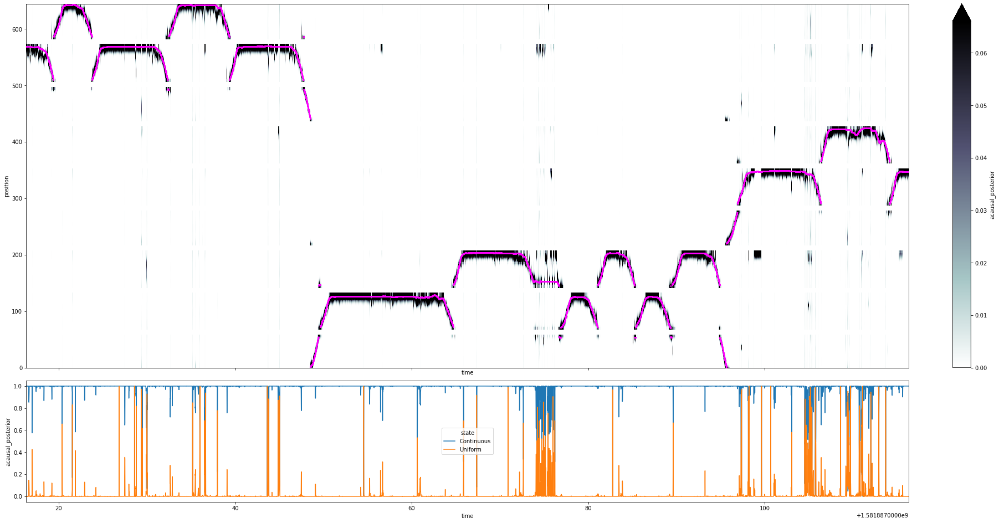

In [23]:
import matplotlib.pyplot as plt

time_slice = slice(50_000, 100_000)

fig, axes = plt.subplots(2, 1, figsize=(25, 13), sharex=True, constrained_layout=True, gridspec_kw={"height_ratios": [3, 1]},)

results.isel(time=time_slice).acausal_posterior.sum('state').plot(x='time', y='position', ax=axes[0], robust=True, cmap='bone_r')
axes[0].scatter(linear_position_df.iloc[time_slice].index,
                linear_position_df.iloc[time_slice].linear_position.values,
                s=1, color='magenta', zorder=10)

results.isel(time=time_slice).acausal_posterior.sum('position').plot(x='time', hue='state', ax=axes[1])

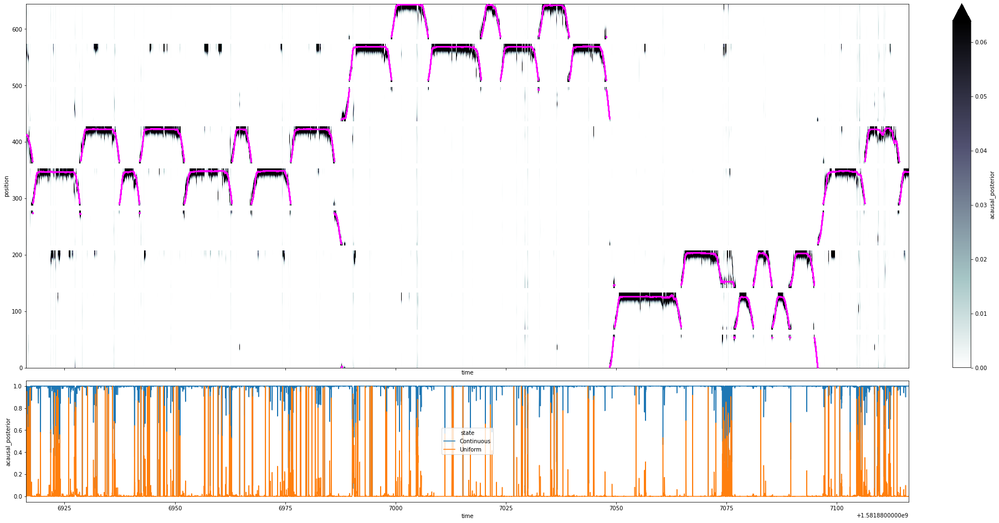

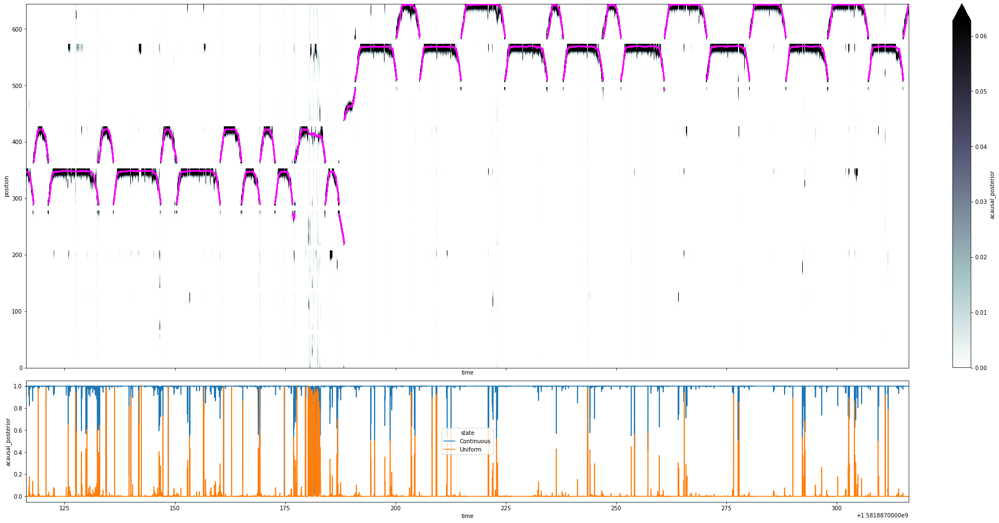

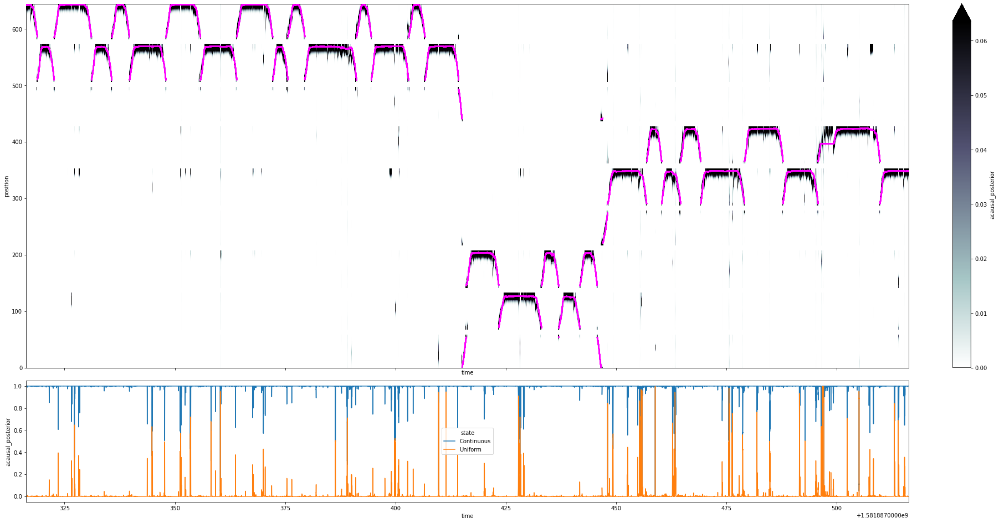

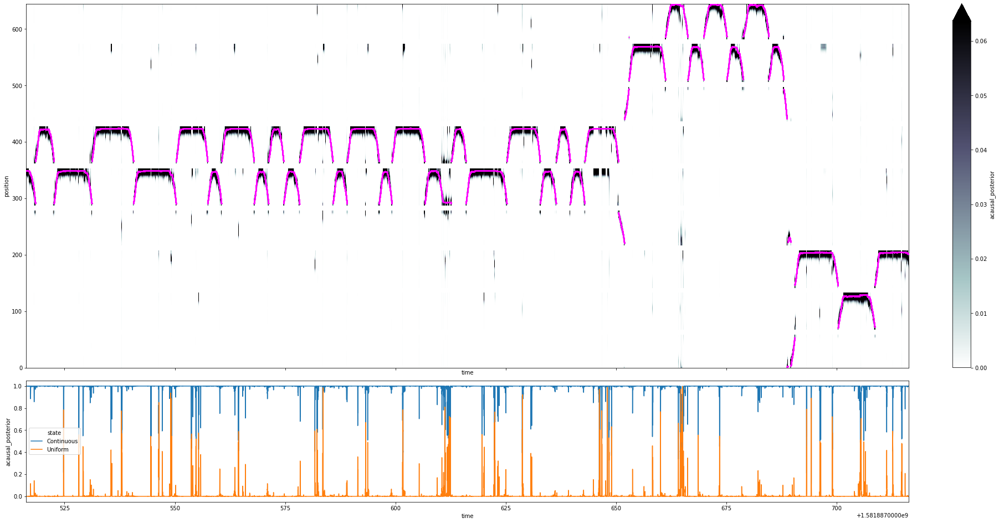

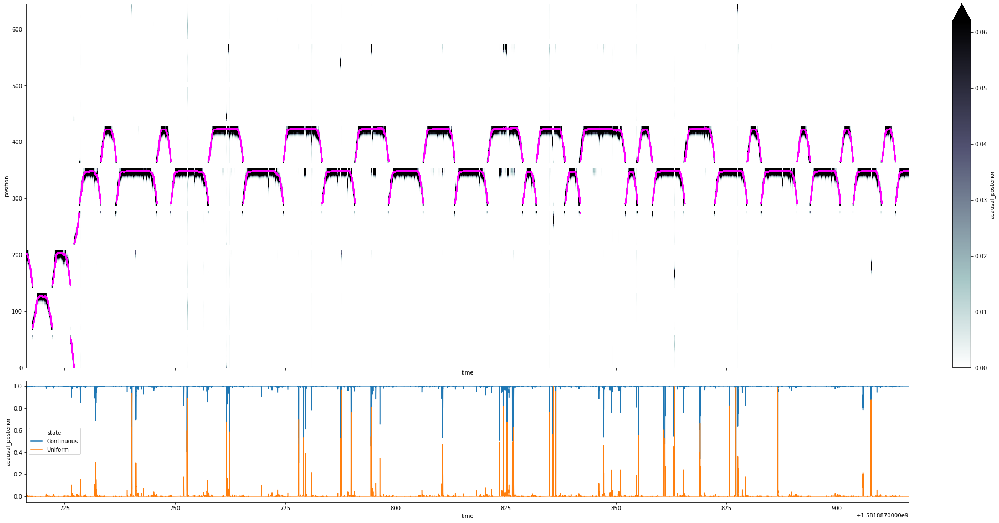

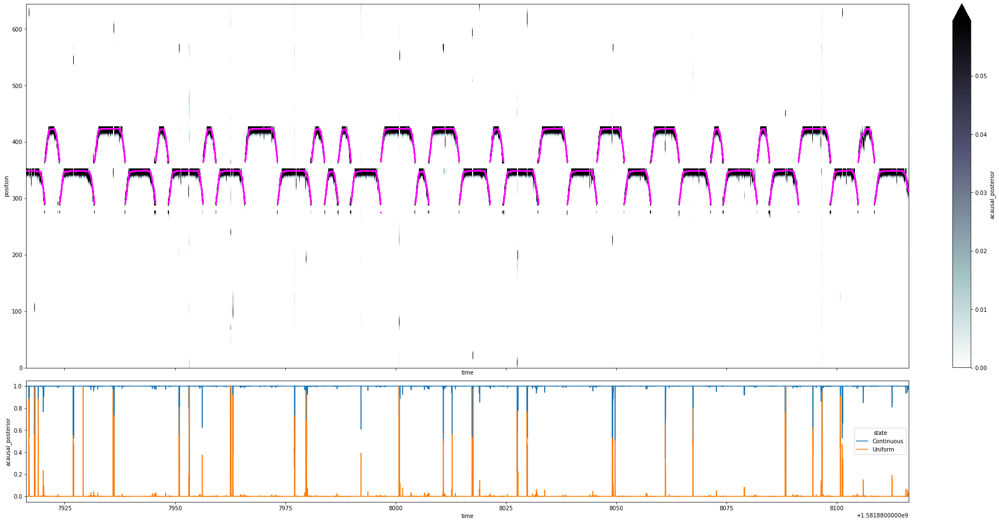

In [24]:
for time_ind in range(0, 600_000, 100_000):
    time_slice = slice(time_ind, time_ind + 100_000)

    fig, axes = plt.subplots(2, 1, figsize=(25, 13), sharex=True, constrained_layout=True, gridspec_kw={"height_ratios": [3, 1]},)
    results.isel(time=time_slice).acausal_posterior.sum('state').plot(x='time', y='position', ax=axes[0], robust=True, cmap='bone_r')
    axes[0].scatter(linear_position_df.iloc[time_slice].index,
                    linear_position_df.iloc[time_slice].linear_position.values,
                    s=1, color='magenta', zorder=10)

    results.isel(time=time_slice).acausal_posterior.sum('position').plot(x='time', hue='state', ax=axes[1])

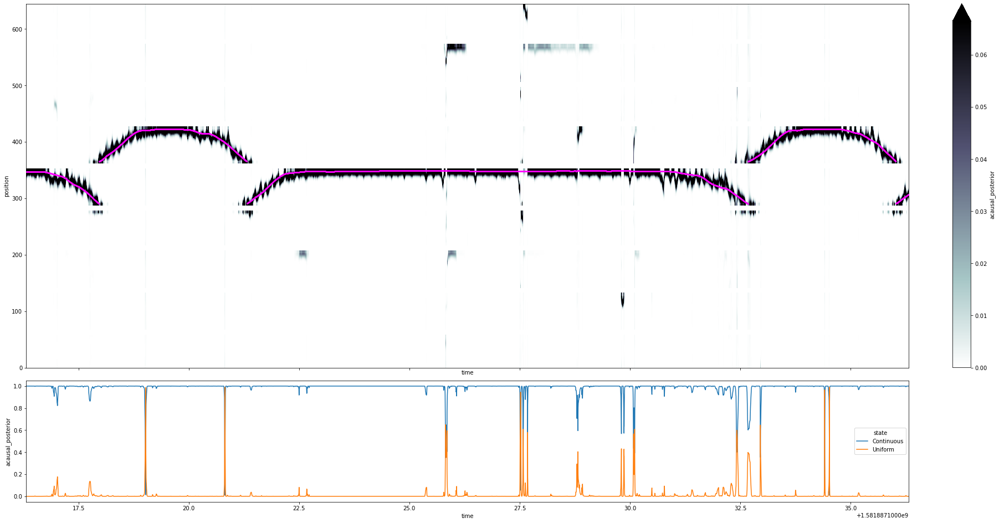

In [25]:
import matplotlib.pyplot as plt

time_slice = slice(100_000, 110_000)

fig, axes = plt.subplots(2, 1, figsize=(25, 13), sharex=True, constrained_layout=True, gridspec_kw={"height_ratios": [3, 1]},)

results.isel(time=time_slice).acausal_posterior.sum('state').plot(x='time', y='position', ax=axes[0], robust=True, cmap='bone_r')
axes[0].scatter(linear_position_df.iloc[time_slice].index,
                linear_position_df.iloc[time_slice].linear_position.values,
                s=1, color='magenta', zorder=10)

results.isel(time=time_slice).acausal_posterior.sum('position').plot(x='time', hue='state', ax=axes[1])

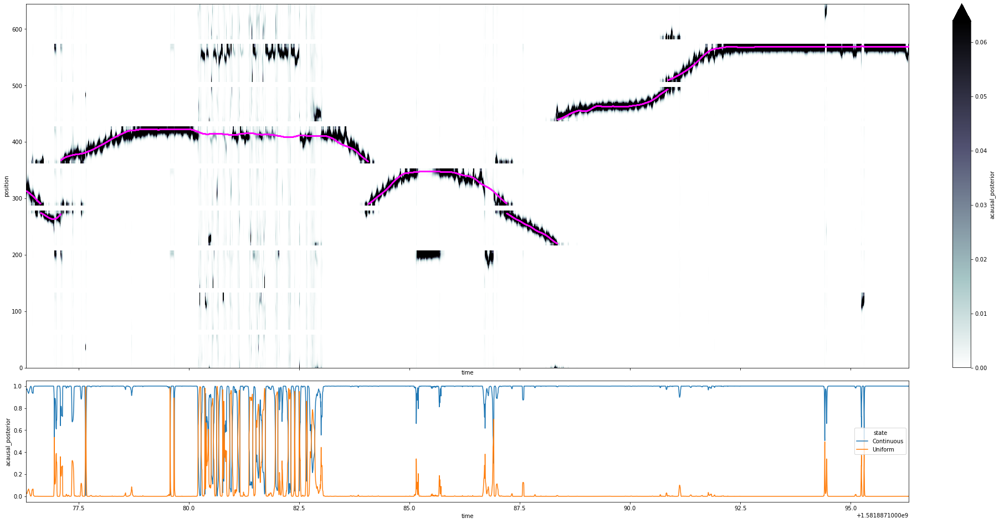

In [26]:
import matplotlib.pyplot as plt

time_slice = slice(130_000, 140_000)

fig, axes = plt.subplots(2, 1, figsize=(25, 13), sharex=True, constrained_layout=True, gridspec_kw={"height_ratios": [3, 1]},)

results.isel(time=time_slice).acausal_posterior.sum('state').plot(x='time', y='position', ax=axes[0], robust=True, cmap='bone_r')
axes[0].scatter(linear_position_df.iloc[time_slice].index,
                linear_position_df.iloc[time_slice].linear_position.values,
                s=1, color='magenta', zorder=10)

results.isel(time=time_slice).acausal_posterior.sum('position').plot(x='time', hue='state', ax=axes[1])

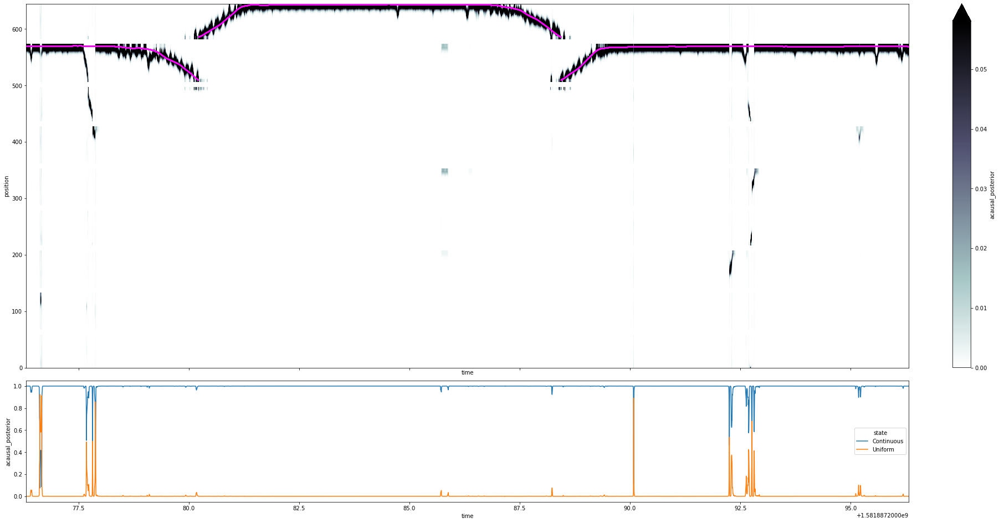

In [27]:
import matplotlib.pyplot as plt

time_slice = slice(180_000, 190_000)

fig, axes = plt.subplots(2, 1, figsize=(25, 13), sharex=True, constrained_layout=True, gridspec_kw={"height_ratios": [3, 1]},)

results.isel(time=time_slice).acausal_posterior.sum('state').plot(x='time', y='position', ax=axes[0], robust=True, cmap='bone_r')
axes[0].scatter(linear_position_df.iloc[time_slice].index,
                linear_position_df.iloc[time_slice].linear_position.values,
                s=1, color='magenta', zorder=10)

results.isel(time=time_slice).acausal_posterior.sum('position').plot(x='time', hue='state', ax=axes[1])

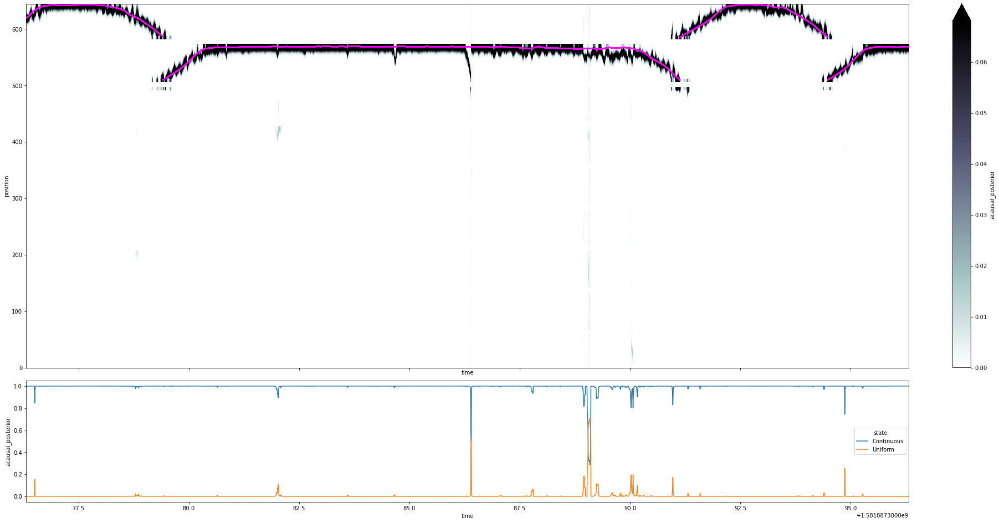

In [28]:
import matplotlib.pyplot as plt

time_slice = slice(230_000, 240_000)

fig, axes = plt.subplots(2, 1, figsize=(25, 13), sharex=True, constrained_layout=True, gridspec_kw={"height_ratios": [3, 1]},)

results.isel(time=time_slice).acausal_posterior.sum('state').plot(x='time', y='position', ax=axes[0], robust=True, cmap='bone_r')
axes[0].scatter(linear_position_df.iloc[time_slice].index,
                linear_position_df.iloc[time_slice].linear_position.values,
                s=1, color='magenta', zorder=10)

results.isel(time=time_slice).acausal_posterior.sum('position').plot(x='time', hue='state', ax=axes[1])